<a href="https://colab.research.google.com/github/kadobkina/nlp_pytorch/blob/master/nlp_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import random

import pandas as pd
import numpy as np

import torch
import torchtext
import torch.nn as nn
from torchvision import datasets, transforms

In [2]:
from google.colab import files
files.upload()

Saving meatinfo.csv to meatinfo.csv


{'meatinfo.csv': b'text;mtype\n12 \xd1\x87\xd0\xb0\xd1\x81\xd1\x82\xd0\xb5\xd0\xb9 \xd0\xb1\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0  12 \xd1\x87\xd0\xb0\xd1\x81\xd1\x82\xd0\xb5\xd0\xb9 \xd0\xb1\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0;\xd0\x91\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0\n\xd0\x91\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0, 12 \xd1\x87\xd0\xb0\xd1\x81\xd1\x82\xd0\xb5\xd0\xb9, \xd0\xb7\xd0\xb0\xd0\xbc. \xd1\x86\xd0\xb5\xd0\xbd\xd0\xb0 260 \xd1\x80\xd1\x83\xd0\xb1.;\xd0\x91\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0\n\xd0\x91\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0, 12 \xd1\x87\xd0\xb0\xd1\x81\xd1\x82\xd0\xb5\xd0\xb9, \xd0\xb7\xd0\xb0\xd0\xbc. \xd1\x86\xd0\xb5\xd0\xbd\xd0\xb0 315 \xd1\x80\xd1\x83\xd0\xb1.;\xd0\x91\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0\n\xd0\x91\xd0\xb0\xd1\x80\xd0\xb0\xd0\xbd\xd0\xb8\xd0\xbd\xd0\xb0, 12 \xd1\x87\xd0\xb0\xd1\x81\xd1\x82\xd0\xb5\xd0\xb9, \

In [3]:
full_dataset = pd.read_csv('meatinfo.csv', sep=';').dropna()
full_dataset

,text,mtype
0,12 частей баранина 12 частей баранина,Баранина
1,"Баранина, 12 частей, зам. цена 260 руб.",Баранина
2,"Баранина, 12 частей, зам. цена 315 руб.",Баранина
3,"Баранина, 12 частей, охл.",Баранина
4,"Баранина, 12 частей, охл. цена 220 руб.",Баранина
...,...,...
17888,"Ягнятина, шея, бк",Ягнятина
17889,Язык ягненка (н.зеландия) Отварные языки ягнят...,Ягнятина
17890,"Ягнятина, язык, зачищ. цена 100 руб.",Ягнятина
17891,"Як, задние части, 1 категория цена 550 руб.",Як


In [4]:
full_dataset = full_dataset.applymap(str.lower)

In [5]:
full_dataset['mtype'].value_counts()[:10]

говядина    8423
свинина     3053
кура        1571
индейка     1339
баранина    1116
цыпленок     944
кролик       334
утка         196
оленина      193
конина       176
Name: mtype, dtype: int64

In [6]:
full_dataset = full_dataset.loc[full_dataset['mtype'].isin(['говядина', 'свинина', 'кура', 'индейка', 'баранина', 'цыпленок'])]

In [7]:
full_dataset['mtype'].value_counts()

говядина    8423
свинина     3053
кура        1571
индейка     1339
баранина    1116
цыпленок     944
Name: mtype, dtype: int64

In [8]:
full_dataset

,text,mtype
0,12 частей баранина 12 частей баранина,баранина
1,"баранина, 12 частей, зам. цена 260 руб.",баранина
2,"баранина, 12 частей, зам. цена 315 руб.",баранина
3,"баранина, 12 частей, охл.",баранина
4,"баранина, 12 частей, охл. цена 220 руб.",баранина
...,...,...
17816,"цыпленок, четвертина, задняя",цыпленок
17817,"цыпленок, четвертина, задняя цена 100 руб.",цыпленок
17818,цб шеи п/ф свеженка гост зам пак шеи куриные п...,цыпленок
17819,"цыпленок, шея, без кожи",цыпленок


In [9]:
import string
import re

def remove_unnecessary(text):
    new_text = ''.join([ch if ch not in string.punctuation else ' ' for ch in text])
    new_text = re.sub(r'\d+', '', new_text)
    new_text = re.sub(r'\s+', ' ', new_text)
    return new_text

In [10]:
preprocessing = [remove_unnecessary(text) for text in full_dataset['text']]

In [11]:
preprocessing[1]

'баранина частей зам цена руб '

In [12]:
full_dataset['text'] = preprocessing
full_dataset

,text,mtype
0,частей баранина частей баранина,баранина
1,баранина частей зам цена руб,баранина
2,баранина частей зам цена руб,баранина
3,баранина частей охл,баранина
4,баранина частей охл цена руб,баранина
...,...,...
17816,цыпленок четвертина задняя,цыпленок
17817,цыпленок четвертина задняя цена руб,цыпленок
17818,цб шеи п ф свеженка гост зам пак шеи куриные п...,цыпленок
17819,цыпленок шея без кожи,цыпленок


In [13]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [14]:
from nltk.stem.snowball import SnowballStemmer
from nltk import word_tokenize
from nltk.stem import *
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
russian_stopwords = stopwords.words("russian")

stemmer = SnowballStemmer('russian')
stemmed_texts = []

for text in full_dataset['text']:
    tokens = word_tokenize(text)
    stemmed_tokens = ""
    for token in tokens:
        if token not in russian_stopwords:
          stemmed_tokens += stemmer.stem(token) + " "
    stemmed_texts.append(stemmed_tokens)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [15]:
full_dataset['text'] = stemmed_texts
full_dataset

,text,mtype
0,част баранин част баранин,баранина
1,баранин част зам цен руб,баранина
2,баранин част зам цен руб,баранина
3,баранин част охл,баранина
4,баранин част охл цен руб,баранина
...,...,...
17816,цыпленок четвертин задн,цыпленок
17817,цыпленок четвертин задн цен руб,цыпленок
17818,цб ше п ф свеженк гост зам пак ше курин позц с...,цыпленок
17819,цыпленок ше кож,цыпленок


In [16]:
from sklearn.utils import shuffle
#full_dataset = shuffle(full_dataset)
full_dataset

,text,mtype
0,част баранин част баранин,баранина
1,баранин част зам цен руб,баранина
2,баранин част зам цен руб,баранина
3,баранин част охл,баранина
4,баранин част охл цен руб,баранина
...,...,...
17816,цыпленок четвертин задн,цыпленок
17817,цыпленок четвертин задн цен руб,цыпленок
17818,цб ше п ф свеженк гост зам пак ше курин позц с...,цыпленок
17819,цыпленок ше кож,цыпленок


In [17]:
types = full_dataset['mtype'].unique()
ind = [i for i in range(len(types))]

In [18]:
labels = dict(zip(types, ind))
labels

{'баранина': 0,
 'индейка': 1,
 'говядина': 2,
 'свинина': 3,
 'кура': 4,
 'цыпленок': 5}

In [19]:
full_dataset['mtype_num'] = full_dataset['mtype']
full_dataset['mtype_num'] = [labels[item] for item in full_dataset['mtype_num']]
full_dataset

,text,mtype,mtype_num
0,част баранин част баранин,баранина,0
1,баранин част зам цен руб,баранина,0
2,баранин част зам цен руб,баранина,0
3,баранин част охл,баранина,0
4,баранин част охл цен руб,баранина,0
...,...,...,...
17816,цыпленок четвертин задн,цыпленок,5
17817,цыпленок четвертин задн цен руб,цыпленок,5
17818,цб ше п ф свеженк гост зам пак ше курин позц с...,цыпленок,5
17819,цыпленок ше кож,цыпленок,5


In [20]:
full_dataset = full_dataset.drop_duplicates(keep='first')
full_dataset

,text,mtype,mtype_num
0,част баранин част баранин,баранина,0
1,баранин част зам цен руб,баранина,0
3,баранин част охл,баранина,0
4,баранин част охл цен руб,баранина,0
18,баранин прод баранин склад куск вес кг бойн по...,баранина,0
...,...,...,...
17816,цыпленок четвертин задн,цыпленок,5
17817,цыпленок четвертин задн цен руб,цыпленок,5
17818,цб ше п ф свеженк гост зам пак ше курин позц с...,цыпленок,5
17819,цыпленок ше кож,цыпленок,5


In [21]:
full_dataset['mtype'].value_counts()

говядина    4749
свинина     2976
кура        1533
цыпленок     936
индейка      714
баранина     619
Name: mtype, dtype: int64

In [22]:
input = full_dataset.iloc[:, :-2]
input

,text
0,част баранин част баранин
1,баранин част зам цен руб
3,баранин част охл
4,баранин част охл цен руб
18,баранин прод баранин склад куск вес кг бойн по...
...,...
17816,цыпленок четвертин задн
17817,цыпленок четвертин задн цен руб
17818,цб ше п ф свеженк гост зам пак ше курин позц с...
17819,цыпленок ше кож


In [23]:
output = full_dataset.iloc[:, 2:]
output

,mtype_num
0,0
1,0
3,0
4,0
18,0
...,...
17816,5
17817,5
17818,5
17819,5


In [24]:
count_word = {}

In [25]:
for text in input['text']:
    tokens = word_tokenize(text)
    for token in tokens:
        if token in count_word.keys():
            count_word[token] += 1
        else:
            count_word[token] = 1

In [26]:
len(count_word)

7588

In [27]:
new_count_word = { k:v for k,v in count_word.items() if v > 120 }
len(new_count_word)

322

In [28]:
new_input = []
for text in input['text']:
    temp = text
    for word in word_tokenize(text):
        if word not in new_count_word.keys() or len(word)<2:
            temp = re.sub(word, '', text)
            text = temp
    new_input.append(temp)

In [29]:
input['text'] = new_input
input

,text
0,част баранин част баранин
1,баранин част зам цен руб
3,баранин част охл
4,баранин част охл цен руб
18,баранин прод баранин склад вес кг фот руб о...
...,...
17816,цыпленок задн
17817,цыпленок задн цен руб
17818,цб ше гост зам ак ше курин озц гост заморо...
17819,цыпленок ше кож


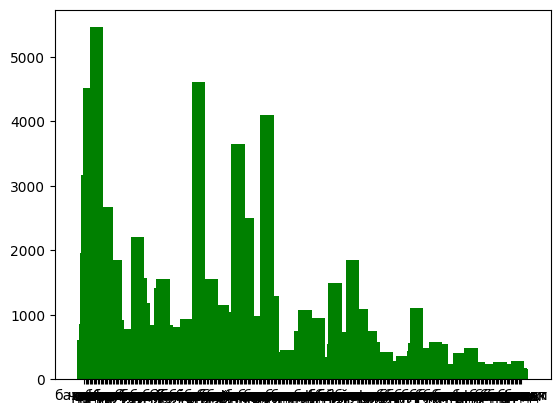

In [30]:
import matplotlib.pyplot as plt

plt.bar(new_count_word.keys(), new_count_word.values(), width=10, color='g')
plt.show()

In [31]:
vocab = []
for text in input['text']:
    vocab += word_tokenize(text)
vocab = list(set(vocab))
vocab[:10]

['каон',
 'едр',
 'потебн',
 'мясоподук',
 'документ',
 'азме',
 'баран',
 'усн',
 'миималь',
 'компн']

In [32]:
import torch.nn as nn

In [33]:
ind = [i for i in range(len(vocab))]

In [34]:
dict_vocab = dict(zip(vocab, ind))

In [35]:
embeds = nn.Embedding(len(vocab), 5)
new_text = []
for text in input['text']:
    for word in word_tokenize(text):
        temp_text = []
        lookup_tensor = torch.tensor([dict_vocab[word]], dtype=torch.long)
        embed = embeds(lookup_tensor)
        temp_text += embed
    new_text.append(temp_text[0])

In [36]:
new_text[:10]

[tensor([-0.4465, -0.0292, -0.4717,  0.4787, -2.4662],
        grad_fn=<UnbindBackward0>),
 tensor([-0.6884, -1.0998,  1.2250,  0.0907,  0.1233],
        grad_fn=<UnbindBackward0>),
 tensor([ 0.8460, -0.7474,  0.6274,  0.0927,  2.9961],
        grad_fn=<UnbindBackward0>),
 tensor([-0.6884, -1.0998,  1.2250,  0.0907,  0.1233],
        grad_fn=<UnbindBackward0>),
 tensor([-0.6884, -1.0998,  1.2250,  0.0907,  0.1233],
        grad_fn=<UnbindBackward0>),
 tensor([ 1.0189,  0.6520,  1.7416, -0.0624, -0.5677],
        grad_fn=<UnbindBackward0>),
 tensor([ 1.0189,  0.6520,  1.7416, -0.0624, -0.5677],
        grad_fn=<UnbindBackward0>),
 tensor([-0.6884, -1.0998,  1.2250,  0.0907,  0.1233],
        grad_fn=<UnbindBackward0>),
 tensor([-2.1135,  1.2728, -0.1180,  0.6998,  1.5669],
        grad_fn=<UnbindBackward0>),
 tensor([ 1.3347, -0.5390,  0.6195,  0.0192,  2.3223],
        grad_fn=<UnbindBackward0>)]

In [37]:
input['text'] = [i.detach().numpy() for i in new_text]
input['text'][:10]

0     [-0.4464902, -0.029195782, -0.47165528, 0.4786...
1     [-0.6883921, -1.0998261, 1.224966, 0.09070421,...
3     [0.84596807, -0.7473842, 0.6273779, 0.09272462...
4     [-0.6883921, -1.0998261, 1.224966, 0.09070421,...
18    [-0.6883921, -1.0998261, 1.224966, 0.09070421,...
19    [1.0188546, 0.6520125, 1.741634, -0.062375136,...
20    [1.0188546, 0.6520125, 1.741634, -0.062375136,...
21    [-0.6883921, -1.0998261, 1.224966, 0.09070421,...
22    [-2.1134713, 1.2727667, -0.11798606, 0.6998183...
23    [1.3346941, -0.5390418, 0.6194527, 0.019161092...
Name: text, dtype: object

In [38]:
sst = []
temp_list = []
for i in input['text']:
    st = str(i).strip()
    sst.append(re.sub(r'\s+', ' ', st))
print(sst[0])
for i in range(len(sst)):
    sst[i] = sst[i][1:-1].strip()
    temp_list.append(sst[i].strip().split(' '))
print(sst[0])

[-0.4464902 -0.02919578 -0.47165528 0.4786859 -2.4661748 ]
-0.4464902 -0.02919578 -0.47165528 0.4786859 -2.4661748


In [39]:
input['num1'] = [float(el[0]) for el in temp_list]
input['num2'] = [float(el[1]) for el in temp_list]
input['num3'] = [float(el[2]) for el in temp_list]

In [40]:
input['num4'] = [float(el[3]) for el in temp_list]
input['num5'] = [float(el[4]) for el in temp_list]

In [41]:
input['num1'] = [float(el[0]) for el in temp_list]
input['num2'] = [float(el[1]) for el in temp_list]
input['num3'] = [float(el[2]) for el in temp_list]
input['num4'] = [float(el[3]) for el in temp_list]
input['num5'] = [float(el[4]) for el in temp_list]

In [43]:
input['num6'] = [float(el[5]) for el in temp_list]
input['num7'] = [float(el[6]) for el in temp_list]
input['num8'] = [float(el[7]) for el in temp_list]
input['num9'] = [float(el[8]) for el in temp_list]
input['num10'] = [float(el[9]) for el in temp_list]

IndexError: ignored

In [44]:
sst[:10]

['-0.4464902 -0.02919578 -0.47165528 0.4786859 -2.4661748',
 '-0.6883921 -1.0998261 1.224966 0.09070421 0.123285',
 '0.84596807 -0.7473842 0.6273779 0.09272462 2.9961126',
 '-0.6883921 -1.0998261 1.224966 0.09070421 0.123285',
 '-0.6883921 -1.0998261 1.224966 0.09070421 0.123285',
 '1.0188546 0.6520125 1.741634 -0.06237514 -0.5677061',
 '1.0188546 0.6520125 1.741634 -0.06237514 -0.5677061',
 '-0.6883921 -1.0998261 1.224966 0.09070421 0.123285',
 '-2.1134713 1.2727667 -0.11798606 0.6998183 1.5669057',
 '1.3346941 -0.5390418 0.6194527 0.01916109 2.3222916']

In [45]:
input[:10]

,text,num1,num2,num3,num4,num5
0,"[-0.4464902, -0.029195782, -0.47165528, 0.4786...",-0.446490,-0.029196,-0.471655,0.478686,-2.466175
1,"[-0.6883921, -1.0998261, 1.224966, 0.09070421,...",-0.688392,-1.099826,1.224966,0.090704,0.123285
3,"[0.84596807, -0.7473842, 0.6273779, 0.09272462...",0.845968,-0.747384,0.627378,0.092725,2.996113
4,"[-0.6883921, -1.0998261, 1.224966, 0.09070421,...",-0.688392,-1.099826,1.224966,0.090704,0.123285
18,"[-0.6883921, -1.0998261, 1.224966, 0.09070421,...",-0.688392,-1.099826,1.224966,0.090704,0.123285
19,"[1.0188546, 0.6520125, 1.741634, -0.062375136,...",1.018855,0.652012,1.741634,-0.062375,-0.567706
20,"[1.0188546, 0.6520125, 1.741634, -0.062375136,...",1.018855,0.652012,1.741634,-0.062375,-0.567706
21,"[-0.6883921, -1.0998261, 1.224966, 0.09070421,...",-0.688392,-1.099826,1.224966,0.090704,0.123285
22,"[-2.1134713, 1.2727667, -0.11798606, 0.6998183...",-2.113471,1.272767,-0.117986,0.699818,1.566906
23,"[1.3346941, -0.5390418, 0.6194527, 0.019161092...",1.334694,-0.539042,0.619453,0.019161,2.322292


In [46]:
input = input.iloc[:,1:]
input[:10]

,num1,num2,num3,num4,num5
0,-0.446490,-0.029196,-0.471655,0.478686,-2.466175
1,-0.688392,-1.099826,1.224966,0.090704,0.123285
3,0.845968,-0.747384,0.627378,0.092725,2.996113
4,-0.688392,-1.099826,1.224966,0.090704,0.123285
18,-0.688392,-1.099826,1.224966,0.090704,0.123285
19,1.018855,0.652012,1.741634,-0.062375,-0.567706
20,1.018855,0.652012,1.741634,-0.062375,-0.567706
21,-0.688392,-1.099826,1.224966,0.090704,0.123285
22,-2.113471,1.272767,-0.117986,0.699818,1.566906
23,1.334694,-0.539042,0.619453,0.019161,2.322292


In [47]:
from torch.utils.data import random_split, DataLoader, TensorDataset

In [48]:
input = torch.Tensor(input.to_numpy())
print('\nInput format: ', input.shape, input.dtype)
output = torch.tensor(output.to_numpy())
print('Output format: ', output.shape, output.dtype)
data = TensorDataset(input, output)


Input format:  torch.Size([11527, 5]) torch.float32
Output format:  torch.Size([11527, 1]) torch.int64


In [49]:
input, type(input)

(tensor([[-0.4465, -0.0292, -0.4717,  0.4787, -2.4662],
         [-0.6884, -1.0998,  1.2250,  0.0907,  0.1233],
         [ 0.8460, -0.7474,  0.6274,  0.0927,  2.9961],
         ...,
         [ 0.8812, -0.2101, -1.8479, -1.1820,  0.4293],
         [ 0.5016, -0.9344,  3.3684, -0.8972, -0.7688],
         [-0.6884, -1.0998,  1.2250,  0.0907,  0.1233]]),
 torch.Tensor)

In [50]:
output, type(output)

(tensor([[0],
         [0],
         [0],
         ...,
         [5],
         [5],
         [5]]),
 torch.Tensor)

In [51]:
input.size(), output.size()

(torch.Size([11527, 5]), torch.Size([11527, 1]))

In [52]:
output = output.t()

In [53]:
output.size()

torch.Size([1, 11527])

In [54]:
output = output[0]

In [55]:
output.size()

torch.Size([11527])

In [56]:
print('Output format: ', output.shape, output.dtype)
data = TensorDataset(input, output)

Output format:  torch.Size([11527]) torch.int64


In [57]:
train_batch_size = 64
number_rows = len(input)
test_split = int(number_rows*0.2)
validate_split = int(number_rows*0.2)
train_split = number_rows - test_split - validate_split
train_set, validate_set, test_set = random_split(data, [train_split,  validate_split, test_split])

train_loader = DataLoader(train_set, batch_size = train_batch_size, shuffle = True)
test_loader = DataLoader(test_set, batch_size = 1)
validate_loader = DataLoader(validate_set, batch_size = 1)

In [58]:
import torch.nn.functional as F

In [59]:
list(input.shape)[1]

5

In [60]:
# Define model parameters
input_size = list(input.shape)[1]   # = 4. The input depends on how many features we initially feed the model. In our case, there are 4 features for every predict value
learning_rate = 0.01
output_size = len(labels)           # The output is prediction results for three types of Irises.


# Define neural network
class Network(nn.Module):
   def __init__(self, input_size, output_size):
       super(Network, self).__init__()

       self.layer1 = nn.Linear(input_size, 64)
       self.layer2 = nn.Linear(64, 32)
       self.layer3 = nn.Linear(32, output_size)


   def forward(self, x):
       x1 = F.relu(self.layer1(x))
       x2 = F.relu(self.layer2(x1))
       x3 = F.softmax(self.layer3(x2))
       return x3

# Instantiate the model
model = Network(input_size, output_size)

In [61]:
# Define your execution device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("The model will be running on", device, "device\n")
model.to(device)    # Convert model parameters and buffers to CPU or Cuda

The model will be running on cpu device



Network(
  (layer1): Linear(in_features=5, out_features=64, bias=True)
  (layer2): Linear(in_features=64, out_features=32, bias=True)
  (layer3): Linear(in_features=32, out_features=6, bias=True)
)

In [62]:
# Function to save the model
def saveModel():
    path = "./NetModel.pth"
    torch.save(model.state_dict(), path)

In [63]:
import torch.optim as optim
from torch.optim import Adam
import torch.nn as nn

In [64]:
# Define the loss function with Classification Cross-Entropy loss and an optimizer with Adam optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(model.parameters(), lr=0.001, weight_decay=0.0001)

In [65]:
# Training Function
def train(num_epochs):
    best_accuracy = 0.0

    print("Begin training...")
    for epoch in range(1, num_epochs+1):
        running_train_loss = 0.0
        running_accuracy = 0.0
        running_vall_loss = 0.0
        total = 0

        # Training Loop
        for data in train_loader:
        #for data in enumerate(train_loader, 0):
            inputs, outputs = data  # get the input and real species as outputs; data is a list of [inputs, outputs]
            optimizer.zero_grad()   # zero the parameter gradients
            predicted_outputs = model(inputs)   # predict output from the model
            train_loss = loss_fn(predicted_outputs, outputs)   # calculate loss for the predicted output
            train_loss.backward()   # backpropagate the loss
            optimizer.step()        # adjust parameters based on the calculated gradients
            running_train_loss +=train_loss.item()  # track the loss value

        # Calculate training loss value
        train_loss_value = running_train_loss/len(train_loader)

        # Validation Loop
        with torch.no_grad():
            model.eval()
            for data in validate_loader:
               inputs, outputs = data
               predicted_outputs = model(inputs)
               val_loss = loss_fn(predicted_outputs, outputs)

               # The label with the highest value will be our prediction
               _, predicted = torch.max(predicted_outputs, 1)
               running_vall_loss += val_loss.item()
               total += outputs.size(0)
               running_accuracy += (predicted == outputs).sum().item()

        # Calculate validation loss value
        val_loss_value = running_vall_loss/len(validate_loader)

        # Calculate accuracy as the number of correct predictions in the validation batch divided by the total number of predictions done.
        accuracy = (100 * running_accuracy / total)

        # Save the model if the accuracy is the best
        if accuracy > best_accuracy:
            saveModel()
            best_accuracy = accuracy

        # Print the statistics of the epoch
        print('Completed training batch', epoch, 'Training Loss is: %.4f' %train_loss_value, 'Validation Loss is: %.4f' %val_loss_value, 'Accuracy is %d %%' % (accuracy))

In [66]:
# Function to test the model
def test():
    # Load the model that we saved at the end of the training loop
    model = Network(input_size, output_size)
    path = "NetModel.pth"
    model.load_state_dict(torch.load(path))

    running_accuracy = 0
    total = 0

    with torch.no_grad():
        for data in test_loader:
            inputs, outputs = data
            outputs = outputs.to(torch.float32)
            predicted_outputs = model(inputs)
            _, predicted = torch.max(predicted_outputs, 1)
            total += outputs.size(0)
            running_accuracy += (predicted == outputs).sum().item()

        print('Accuracy of the model based on the test set of', test_split ,'inputs is: %d %%' % (100 * running_accuracy / total))


# Optional: Function to test which species were easier to predict
def test_species():
    # Load the model that we saved at the end of the training loop
    model = Network(input_size, output_size)
    path = "NetModel.pth"
    model.load_state_dict(torch.load(path))

    labels_length = len(labels) # how many labels of Irises we have. = 3 in our database.
    labels_correct = list(0. for i in range(labels_length)) # list to calculate correct labels [how many correct setosa, how many correct versicolor, how many correct virginica]
    labels_total = list(0. for i in range(labels_length))   # list to keep the total # of labels per type [total setosa, total versicolor, total virginica]

    with torch.no_grad():
        for data in test_loader:
            inputs, outputs = data
            predicted_outputs = model(inputs)
            _, predicted = torch.max(predicted_outputs, 1)

            label_correct_running = (predicted == outputs).squeeze()
            label = outputs[0]
            if label_correct_running.item():
                labels_correct[label] += 1
            labels_total[label] += 1

    label_list = list(labels.keys())
    for i in range(output_size):
        print('Accuracy to predict %5s : %2d %%' % (label_list[i], 100 * labels_correct[i] / labels_total[i]))

In [67]:
num_epochs = 40
train(num_epochs)
print('Finished Training\n')
test()
test_species()

Begin training...


<ipython-input-60-5b1e91b053c6>:20: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x3 = F.softmax(self.layer3(x2))


Completed training batch 1 Training Loss is: 1.6717 Validation Loss is: 1.6288 Accuracy is 41 %
Completed training batch 2 Training Loss is: 1.6240 Validation Loss is: 1.6237 Accuracy is 41 %
Completed training batch 3 Training Loss is: 1.6213 Validation Loss is: 1.6207 Accuracy is 41 %
Completed training batch 4 Training Loss is: 1.6163 Validation Loss is: 1.6211 Accuracy is 41 %
Completed training batch 5 Training Loss is: 1.6149 Validation Loss is: 1.6169 Accuracy is 41 %
Completed training batch 6 Training Loss is: 1.6154 Validation Loss is: 1.6149 Accuracy is 41 %
Completed training batch 7 Training Loss is: 1.6138 Validation Loss is: 1.6126 Accuracy is 42 %
Completed training batch 8 Training Loss is: 1.6115 Validation Loss is: 1.6122 Accuracy is 42 %
Completed training batch 9 Training Loss is: 1.6108 Validation Loss is: 1.6102 Accuracy is 41 %
Completed training batch 10 Training Loss is: 1.6049 Validation Loss is: 1.6102 Accuracy is 43 %
Completed training batch 11 Training Lo